In [1]:
import os
import csv
from sklearn.model_selection import train_test_split
import cv2
import numpy as np
import sklearn
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib
from skimage import exposure
from keras.models import Sequential, Model
from keras.layers.core import Dense, Activation, Flatten, Dropout
from keras.layers.convolutional import Convolution2D, Cropping2D
from keras.layers.pooling import MaxPooling2D

from keras.applications.resnet50 import ResNet50, preprocess_input
from keras.applications.inception_v3 import InceptionV3
from keras.applications.vgg16 import VGG16
from keras.layers import Dense, Flatten, Input, AveragePooling2D, GlobalAveragePooling2D, Lambda, Dropout
from keras.layers.normalization import BatchNormalization
from keras.models import load_model
import keras
from keras.optimizers import Adam

Using TensorFlow backend.


In [2]:
samples = []
b_size = 32
ch, row, col = 3, 160, 320  # Trimmed image format
steering_limit = 1

for root, dirs, files in os.walk("./../../../"):
	for file in files:
		if file.endswith(".csv"):
			#print(os.path.join(root, file))
			with open(os.path.join(root, file)) as csvfile:
				reader = csv.reader(csvfile)
				for line in reader:
					# steering_angle = line[3] 
					# if (steering_angle > 0 and steering_angle < steering_limit):
					# 	samples.append(line)
					# elif (steering_angle < 0 and steering_angle > steering_limit):
					# 	samples.append(line)
					samples.append(line)
					

In [3]:
def add_random_shadow(image):
	top_y = 320*np.random.uniform()
	top_x = 0
	bot_x = 160
	bot_y = 320*np.random.uniform()
	image_hls = cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
	shadow_mask = 0*image_hls[:,:,1]
	X_m = np.mgrid[0:image.shape[0],0:image.shape[1]][0]
	Y_m = np.mgrid[0:image.shape[0],0:image.shape[1]][1]

	shadow_mask[((X_m-top_x)*(bot_y-top_y) -(bot_x - top_x)*(Y_m-top_y) >=0)]=1
	random_bright = .25+.7*np.random.uniform()
	#random_bright = .5
	cond1 = shadow_mask==1
	cond0 = shadow_mask==0
	if np.random.randint(2)==1:
		image_hls[:,:,1][cond1] = image_hls[:,:,1][cond1]*random_bright
	else:
		image_hls[:,:,1][cond0] = image_hls[:,:,1][cond0]*random_bright    
	image = cv2.cvtColor(image_hls,cv2.COLOR_HLS2RGB)
	#image = cv2.cvtColor(image_hls,cv2.COLOR_RGB2HSV)

	return image

def trans_image(image,steer,trans_range):
	# Translation
	tr_x = trans_range*np.random.uniform()-trans_range/2
	steer_ang = steer + tr_x/trans_range*2*.2
	tr_y = 40*np.random.uniform()-40/2
	#tr_y = 0
	Trans_M = np.float32([[1,0,tr_x],[0,1,tr_y]])
	image_tr = cv2.warpAffine(image,Trans_M,(col,row))
	
	return image_tr,steer_ang

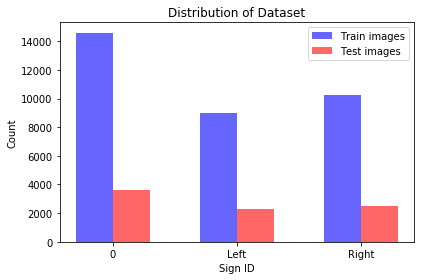

In [4]:
angles_zero_valid = []
angles_left_valid = []
angles_right_valid = []
angles_zero = []
angles_left = []
angles_right = []

train_samples, validation_samples = train_test_split(samples, test_size=0.20)

for tempSample in train_samples:
	angle = float(tempSample[3])
	if angle == 0:
		angles_zero.append(angle)
	elif angle > 0:
		angles_right.append(angle)
	elif angle < 0:
		angles_left.append(angle)

for tempSample in validation_samples:
	angle = float(tempSample[3])
	if angle == 0:
		angles_zero_valid.append(angle)
	elif angle > 0:
		angles_right_valid.append(angle)
	elif angle < 0:
		angles_left_valid.append(angle)



fig, ax = plt.subplots()

index = np.arange(3)
bar_width = 0.3

opacity = 0.6

rects1 = plt.bar(index, (len(angles_zero),len(angles_right),len(angles_left)), bar_width,
                 alpha=opacity,
                 color='b',
                 label='Train images')

rects2 = plt.bar(index + bar_width, (len(angles_zero_valid),len(angles_right_valid),len(angles_left_valid)), bar_width,
                 alpha=opacity,
                 color='r',
                 label='Test images')


plt.xlabel('Sign ID')
plt.ylabel('Count')
plt.title('Distribution of Dataset')
plt.xticks(index + bar_width / 2, ('0','Left','Right'))
plt.legend()
plt.tight_layout()
plt.show()


This distribution show a pretty balanced ratio between left angles and right angles. However the 0-angle is still to dominant...

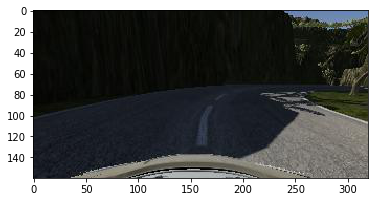

In [5]:
img = mpimg.imread(samples[10050][0])
imgplot = plt.imshow(img)
plt.show()


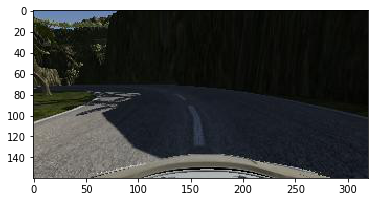

In [6]:
imgplot = plt.imshow(np.fliplr(img))
plt.show()

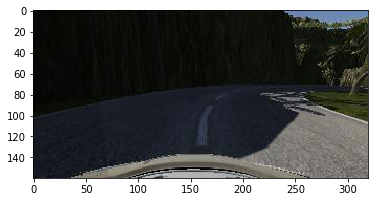

In [7]:
imgplot = plt.imshow(add_random_shadow(img))
plt.show()


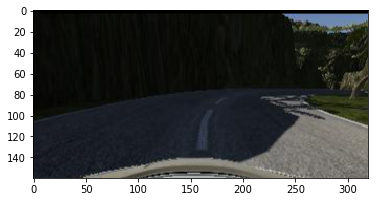

In [8]:
imgplot = plt.imshow(trans_image(img,-0.15,150.0)[0])
plt.show()

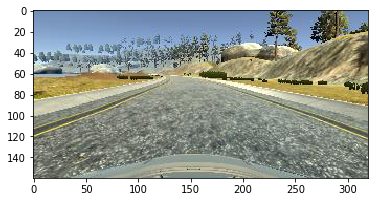

In [9]:
img = mpimg.imread(samples[4000][0])
imgplot = plt.imshow(img)
plt.show()

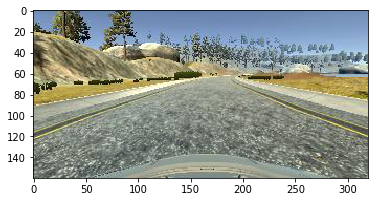

In [10]:
imgplot = plt.imshow(np.fliplr(img))
plt.show()

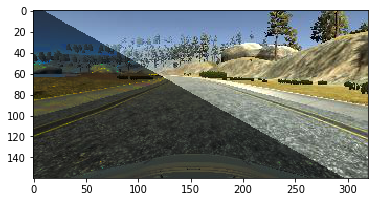

In [11]:
imgplot = plt.imshow(add_random_shadow(img))
plt.show()

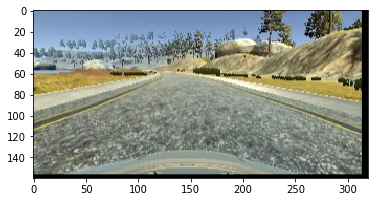

In [12]:
imgplot = plt.imshow(trans_image(img,-0.15,150.0)[0])
plt.show()

In [13]:
model = Sequential()

model.add(Lambda(lambda x: x/255 - .5, input_shape=(row, col , ch)))
model.add(Cropping2D(cropping=((70,25),(0,0))))

model.add(Convolution2D(24,5,5,subsample=(2,2),activation="relu"))
model.add(Dropout(0.1))
model.add(Convolution2D(36,5,5,subsample=(2,2),activation="relu"))
model.add(Convolution2D(48,5,5,subsample=(2,2),activation="relu"))
model.add(Dropout(0.1))
model.add(Convolution2D(64,3,3,activation="relu"))
model.add(Convolution2D(64,3,3,activation="relu"))
model.add(Flatten())
model.add(Dense(100))
model.add(BatchNormalization())
model.add(Dense(50))
model.add(BatchNormalization())
model.add(Dense(10))
model.add(BatchNormalization())
model.add(Dense(1))

adam = Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
model.compile(loss='mse', optimizer=adam)

In [14]:
# now show the model summary

model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_1 (Lambda)                (None, 160, 320, 3)   0           lambda_input_1[0][0]             
____________________________________________________________________________________________________
cropping2d_1 (Cropping2D)        (None, 65, 320, 3)    0           lambda_1[0][0]                   
____________________________________________________________________________________________________
convolution2d_1 (Convolution2D)  (None, 31, 158, 24)   1824        cropping2d_1[0][0]               
____________________________________________________________________________________________________
dropout_1 (Dropout)              (None, 31, 158, 24)   0           convolution2d_1[0][0]            
___________________________________________________________________________________________

In [15]:
import os.path


recovery = []
for root, dirs, files in os.walk("./../../../training_data_0a/recovery"):
    for file in files:
        if file.endswith(".jpg"):
            abspath = os.path.join('C:\\_Projects\\Udacity\\BehavioralCloning\\training_data_0a\\recovery', file)
            recovery.append(abspath)
                


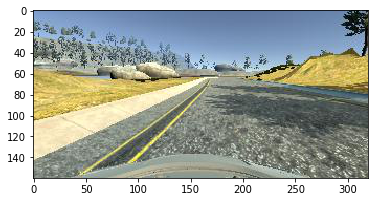

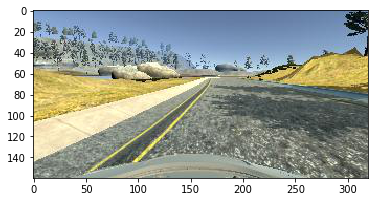

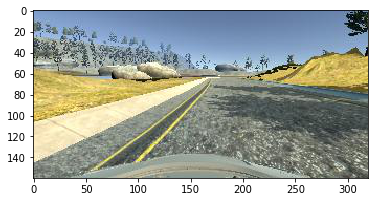

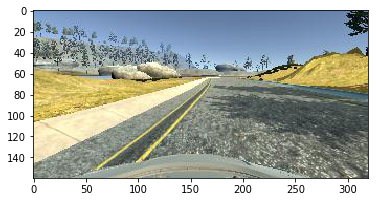

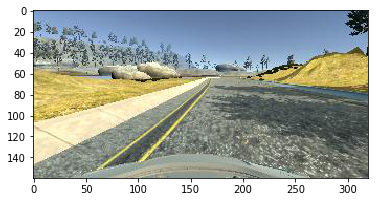

...

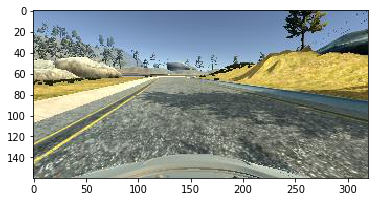

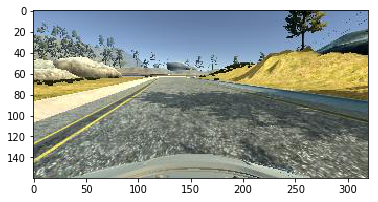

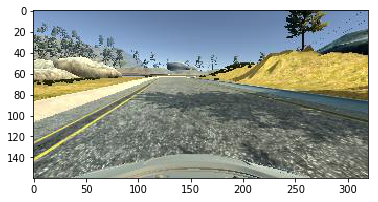

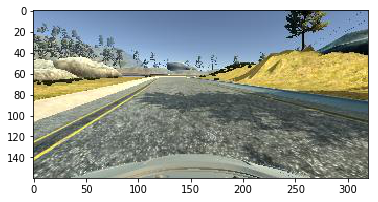

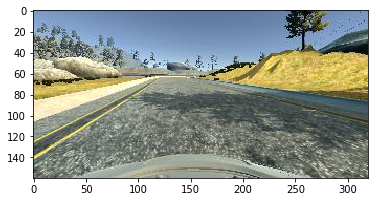

In [16]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib

for i in range(len(recovery)):
    img = mpimg.imread(recovery[i])
    imgplot = plt.imshow(img)
    plt.show()

